## Problem 2: Visualize an interactive map (10 points)

Create a nice INTERACTIVE map using the skills you leared in [lesson 5: interactive maps](https://automating-gis-processes.github.io/site/notebooks/L5/interactive-map-folium.html) using either Folium or mplleaflet. Write your code into a notebook file (`.ipynb`) or a python script file (.py) and store the output map(s) in `.html` format under the `docs` folder.

**Topic of the map:**
- You can select the topic of the map freely. **Use your imagination.**
- This map should not be only an interactive version of your submission for problem 1 ;). Create something new!
- Feel free to adapt examples provided in this course!

**Criteria:**
- The map should have multiple layers on it and/or present an output of (simple) data analysis
- Consider [good cartographic practices](https://www.gislounge.com/ten-things-to-consider-when-making-a-map/)
- The map should demonstrate skills learned during [lesson 5: interactive maps](https://automating-gis-processes.github.io/2018/notebooks/L5/interactive-map-folium.html) and throughout this course. You can also take advantage of the [Folium example gallery](https://nbviewer.jupyter.org/github/python-visualization/folium/tree/master/examples/).
- Think about including additional interactive elements, such as popup text in the map.

In [61]:
#import modules
import geopandas as gpd
import pandas as pd
from pyproj import CRS
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon, LineString
import contextily as ctx
import mplleaflet
import folium
%matplotlib inline

#Reading regional population data from 2018 by statistics finland
fp1 = "dataE5/001_11ra_2018.csv"
data2018 = pd.read_csv(fp1, sep=';')

#reading regional estimates for population in 2040 by statistics finland
fp2 = "dataE5/003_128v_2040.csv"
data = pd.read_csv(fp2, sep=';')

colnames = {'alue' : 'nimi'}
data2018.rename(columns=colnames, inplace=True)
data.rename(columns=colnames, inplace=True)

#reading the geojson data of regional boundaries
url = "http://geo.stat.fi/geoserver/tilastointialueet/wfs?request=GetFeature&typename=tilastointialueet:maakunta1000k_2018&outputformat=JSON"
geodata = gpd.read_file(url)
geodata = geodata[['vuosi', 'nimi', 'maakunta', 'geometry']]

print(data2018.head(1))
print(data.head(1))
print(geodata.head(1))

      nimi  vaesto2018
0  Uusimaa     1671024
      nimi  vaesto2040
0  Uusimaa     1901907
   vuosi                                      nimi maakunta  \
0   2018  Uusimaa                                        01   

                                            geometry  
0  MULTIPOLYGON (((444038.768 6703649.355, 444155...  


In [62]:
#calculating the change in population for each region
data['muutos'] = None
data['2018'] = None
delta = []
d2018 = []
for x, y in zip(data2018['vaesto2018'], data['vaesto2040']):
    change = (y - x) / x * 100
    d2018.append(x)
    delta.append(round(change, 2))
#Adding the change in population to the 2040 dataframe
data['muutos'] = delta
data['2018'] = d2018
data.head(19)

,nimi,vaesto2040,muutos,2018
0,Uusimaa,1901907,13.82,1671024
1,Varsinais-Suomi,484568,1.25,478582
2,Satakunta,191403,-12.45,218624
3,Kanta-Häme,153955,-10.16,171364
4,Pirkanmaa,540430,4.92,515095
5,Päijät-Häme,185436,-7.57,200629
6,Kymenlaakso,143661,-17.14,173388
7,Etelä-Karjala,112138,-12.91,128756
8,Etelä-Savo,116522,-19.43,144615
9,Pohjois-Savo,223779,-8.89,245602


In [63]:
geodata.head(19)

,vuosi,nimi,maakunta,geometry
0,2018,Uusimaa,01,"MULTIPOLYGON (((444038.768 6703649.355, 444155..."
1,2018,Varsinais-Suomi,02,"MULTIPOLYGON (((191622.791 6776769.888, 191700..."
2,2018,Satakunta,04,"MULTIPOLYGON (((204129.176 6879304.426, 204210..."
3,2018,Kanta-Häme,05,"MULTIPOLYGON (((358726.220 6715710.045, 365623..."
4,2018,Pirkanmaa,06,"MULTIPOLYGON (((328776.641 6760201.180, 330233..."
5,2018,Päijät-Häme,07,"MULTIPOLYGON (((424096.839 6726998.038, 424194..."
6,2018,Kymenlaakso,08,"MULTIPOLYGON (((541568.130 6714869.773, 541764..."
7,2018,Kainuu,18,"MULTIPOLYGON (((563043.244 7060737.936, 567078..."
8,2018,Etelä-Karjala,09,"MULTIPOLYGON (((551997.444 6726090.923, 553773..."
9,2018,Etelä-Savo,10,"MULTIPOLYGON (((501677.656 6779725.218, 503874..."


In [64]:
#i had troubles with matching the region names in the dataframes because the geodataframe contained alot of whitespace
#here i'm using strip-function to get rid of all the whitespace around the name of the region
for index, row in geodata.iterrows():
    geodata['nimi'].at[index] = geodata['nimi'].at[index].strip()

In [65]:
#print info
print("Count of original attributes:", len(data))
print("Count of original geometries:", len(geodata))

# Merge data
geodata = geodata.merge(data, on = "nimi")

#Print info
print("Count after the join:", len(geodata))

geodata.head(19)

Count of original attributes: 19
Count of original geometries: 19
Count after the join: 19


,vuosi,nimi,maakunta,geometry,vaesto2040,muutos,2018
0,2018,Uusimaa,01,"MULTIPOLYGON (((444038.768 6703649.355, 444155...",1901907,13.82,1671024
1,2018,Varsinais-Suomi,02,"MULTIPOLYGON (((191622.791 6776769.888, 191700...",484568,1.25,478582
2,2018,Satakunta,04,"MULTIPOLYGON (((204129.176 6879304.426, 204210...",191403,-12.45,218624
3,2018,Kanta-Häme,05,"MULTIPOLYGON (((358726.220 6715710.045, 365623...",153955,-10.16,171364
4,2018,Pirkanmaa,06,"MULTIPOLYGON (((328776.641 6760201.180, 330233...",540430,4.92,515095
5,2018,Päijät-Häme,07,"MULTIPOLYGON (((424096.839 6726998.038, 424194...",185436,-7.57,200629
6,2018,Kymenlaakso,08,"MULTIPOLYGON (((541568.130 6714869.773, 541764...",143661,-17.14,173388
7,2018,Kainuu,18,"MULTIPOLYGON (((563043.244 7060737.936, 567078...",59196,-18.98,73061
8,2018,Etelä-Karjala,09,"MULTIPOLYGON (((551997.444 6726090.923, 553773...",112138,-12.91,128756
9,2018,Etelä-Savo,10,"MULTIPOLYGON (((501677.656 6779725.218, 503874...",116522,-19.43,144615


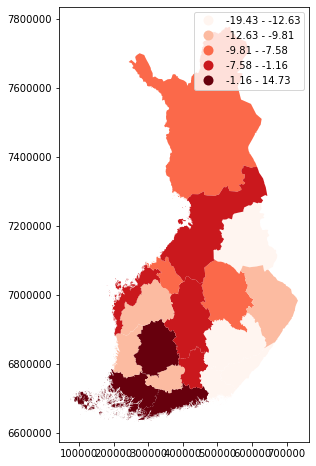

In [66]:
#Seeing that everything's fine
fig, ax = plt.subplots(figsize=(10,8))
geodata.plot(ax=ax, column='muutos', cmap='Reds', scheme='quantiles', legend=True)

In [67]:
#define geoid for folium mapping
geodata['geoid'] = geodata.index.astype(str)
#creating interactive map
map = folium.Map(location=[64.96, 27.59], tiles = 'cartodbpositron', zoom_start=5, control_scale=True)

folium.Choropleth(geo_data = geodata,
                  data = geodata,
                  columns=['geoid','muutos'],
                  key_on='feature.id',
                  fill_color='RdYlBu',
                  line_color='white',
                  line_weight=0,
                  legend_name= 'Change in population (%)').add_to(map)
map

In [68]:
#adjusting the popups for the folium map
folium.features.GeoJson(geodata, name='Labels',
               style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                tooltip=folium.features.GeoJsonTooltip(fields=['muutos'],
                                              aliases = ['Regional change in population between 2018 and 2040'],
                                              labels=True,
                                              sticky=False
                                             )
                       ).add_to(map)

map

In [69]:
#save the map to the repository
outfp = "docs/population_change.html"
map.save(outfp)